# Laboratorio 1

Rafael Ortega  123972 \
Eduardo Moreno  151280 \
Yedam Fortiz 119523

In [1]:
import re
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import csv
import requests

In [2]:
import sys
sys.path.append('./../')

# OPTIONAL: Load the "autoreload" extension so that code can change
%load_ext autoreload

#Own Library modules
import src
# OPTIONAL: always reload modules so that as you change code in src, it gets loaded
%autoreload 2

from src.algorithms import eda as eda_eq

In [3]:
# para leer el archivo como local
agua = pd.read_csv('../data/consumo-agua.csv')

# Para leer el archivo directo desde la url:
#CSV_URL = 'https://datos.cdmx.gob.mx/explore/dataset/consumo-agua/download/?format=csv&timezone=America/Mexico_City&lang=es&use_labels_for_header=true&csv_separator=%2C'
#agua_liga = pd.read_csv(CSV_URL)

# Otra forma de extraerlo desde la liga, pero menos eficiente
# CSV_URL = 'https://datos.cdmx.gob.mx/explore/dataset/consumo-agua/download/?format=csv&timezone=America/Mexico_City&lang=es&use_labels_for_header=true&csv_separator=%2C'
# r = requests.get(CSV_URL)
# with requests.Session() as s:
#     download = s.get(CSV_URL)

#     decoded_content = download.content.decode('utf-8')

#     cr = csv.reader(decoded_content.splitlines(), delimiter=',')
#     my_list = list(cr)

# agua = pd.DataFrame(my_list[1:len(my_list)], columns = my_list[0])

In [4]:
agua.head()

,Geo Point,Geo Shape,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des
0,"19.4552601937,-99.1126617526","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",159.72,2019,Gustavo A. Madero,42.566364,468.23,GUSTAVO A. MADERO,7 DE NOVIEMBRE,53.24,631.00,42.066667,3.05,3,3.05,57250,ALTO
1,"19.4552601937,-99.1126617526","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,35.936667,107.81,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.00,115.13,28.782500,7.32,3,7.32,57253,MEDIO
2,"19.4557195871,-99.1135822797","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,24.586000,122.93,GUSTAVO A. MADERO,7 DE NOVIEMBRE,0.00,197.96,32.993333,75.03,3,75.03,57255,POPULAR
3,"19.4596467168,-99.1044693641","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",0.00,2019,Gustavo A. Madero,0.000000,0.00,GUSTAVO A. MADERO,NUEVA TENOCHTITLAN,0.00,253.53,84.510000,84.51,3,253.53,57267,BAJO
4,"19.4741606185,-99.1467497317","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",56.72,2019,Azcapotzalco,67.436250,539.49,AZCAPOTZALCO,PROHOGAR,56.72,839.35,76.304545,121.57,3,243.14,57330,BAJO


### ¿Cuántas variables tenemos?

In [5]:
len(agua.columns)

17

### ¿Cuántas observaciones tenemos?

In [6]:
len(agua)

71102

### ¿Cuántas observaciones únicas tenemos por variable?

In [7]:
agua.nunique()

Geo Point               22930
Geo Shape               22922
consumo_total_mixto     24339
anio                        1
nomgeo                     17
consumo_prom_dom        52060
consumo_total_dom       47051
alcaldia                   16
colonia                  1340
consumo_prom_mixto      31911
consumo_total           56015
consumo_prom            62214
consumo_prom_no_dom     37440
bimestre                    3
consumo_total_no_dom    27336
gid                     71102
indice_des                  4
dtype: int64

#### Transformaciones que deberán realizarse más adelantte:
Geo Point                object --> split y dos float  
Geo Shape                object   
consumo_total_mixto     float64  
anio                      int64 --> Eliminar    
nomgeo                   object --> Categorica    
consumo_prom_dom        float64  
consumo_total_dom       float64  
alcaldia                 object --> Categorica   
colonia                  object --> Categorica  
consumo_prom_mixto      float64  
consumo_total           float64  
consumo_prom            float64  
consumo_prom_no_dom     float64  
bimestre                  int64 --> Categorica  
consumo_total_no_dom    float64  
gid                       int64 --> Categorica    
indice_des               object --> Categorica   

### ¿Cuántas variables numéricas tenemos?

In [8]:
eda_eq.cuenta_tipo_de_dato(agua,'numerico')

11

### ¿Cuántas variables de fecha tenemos?

In [9]:
eda_eq.cuenta_tipo_de_dato(agua,'Date')

0

### ¿Cuántas variables categóricas tenemos?

In [10]:
eda_eq.cuenta_tipo_de_dato(agua,'category')

0

### ¿Cuántas variables de texto tenemos?

In [11]:
eda_eq.cuenta_tipo_de_dato(agua,'object')

6

### Genera el profiling de cada variable (propio)

#### Perfilamiento general

In [12]:
eda_eq.genera_profiling_general(agua)

El dataframe tiene 17 columnas.
Hay 5 columnas que tienen NA's.


,Estadisticas,Resultado
0,Total de variables,17
1,Conteo de observaciones,71102
2,Total de celdas,1208734
3,Cantidad de variables numericas,11
4,Cantidad de variables de fecha,0
5,Cantidad de variables categóricas,0
6,Cantidad de variables de texto,6
7,Valores faltantes,26318
8,Porcentaje de valores faltantes,2.2%
9,Renglones duplicados,0


In [13]:
eda_eq.cuenta_nulos_por_columnas(agua)

El dataframe tiene 17 columnas.
Hay 5 columnas que tienen NA's.


,Missing Values,% del Total
consumo_total_mixto,8327,11.7
consumo_prom_mixto,8327,11.7
consumo_prom_dom,4820,6.8
consumo_total_dom,4820,6.8
Geo Shape,24,0.0


In [14]:
eda_eq.cuenta_nulos_por_renglones(agua)

Existen un total de:  8908 renglones con al menos un valor nulo

Representan el 12.53% del total de renglones.


8908

In [15]:
eda_eq.cuenta_nulos_por_renglones_tabla(agua)

,renglon,valores_nulos
54555,Nan in row 54555,5
13306,Nan in row 13306,4
24048,Nan in row 24048,4
24061,Nan in row 24061,4
52584,Nan in row 52584,4
24052,Nan in row 24052,4
55696,Nan in row 55696,4
24050,Nan in row 24050,4
24049,Nan in row 24049,4
52583,Nan in row 52583,4


## Perfilamiento por variable

In [16]:
profiling_numerico,profiling_categoricas,profiling_texto = eda_eq.genera_profiling_por_variable(agua)

In [17]:
#pd.set_option('display.max_colwidth', -1)
profiling_numerico

,metrica,anio,bimestre,gid,consumo_total_mixto,consumo_prom_dom,consumo_total_dom,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,consumo_total_no_dom
0,tipo,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64
1,numero de observaciones,71102,71102,71102,62775,66282,66282,62775,71102,71102,71102,71102
2,media,2019,2.01,35551.5,174.36,29.13,1186.26,50.64,1695.85,111.22,126.76,436.06
3,desviacion estándar,0,0.81,20525.5,312.66,64.57,2771.04,130.41,3555.7,1069.95,1095.82,2126.15
4,cuartil 25%,2019,1,17776.2,0,18.69,161.64,0,340.95,23.01,6.28,10.98
5,cuartil 50%,2019,2,35551.5,79.94,26.41,604.18,33.45,896.18,31.69,19.28,54.06
6,cuartil 75%,2019,3,53326.8,233.32,36.25,1261.45,61.22,1808.9,45.48,54.19,230.43
7,minimo,2019,1,1,0,0,0,0,0,0,0,0
8,maximo,2019,3,71102,23404.4,7796.41,95060.7,11702.2,119727,89691.8,89691.8,119727
9,numero de observaciones unicas,1,3,71102,24339,52060,47051,31911,56015,62214,37440,27336


In [18]:
profiling_categoricas

'No hay variables categóricas'

In [19]:
profiling_texto

,metrica,Geo Point,Geo Shape,nomgeo,alcaldia,colonia,indice_des
0,tipo,object,object,object,object,object,object
1,numero de observaciones,71102,71102,71102,71102,71102,71102
2,observaciones unicas,22930,22922,17,16,1340,4
3,% observaciones unicas,0.322494,0.322382,0.000239093,0.000225029,0.0188462,5.62572e-05
4,tamano promedio,27.781,3295.96,12.4034,12.2552,16.8656,4.83564
5,tamano minmo,23,198,6,7,4,4
6,tamano maximo,28,61218,22,19,43,7


### Genera el profiling de cada variable (Pandas profiling)

In [20]:
profile = ProfileReport(agua, title='Pandas Profiling Report')

In [21]:
profile

In [22]:
profile.to_file(output_file = '../results/pandas_profiling_inicial.html')

### ¿Cuántas alcadías tienes? ¿Cuántos nomgeo tienes? ¿Identificas algún error?

In [23]:
alcaldias = pd.unique(agua['alcaldia']) 
alcaldias_n = agua['alcaldia'].nunique()

In [24]:
print(alcaldias)
print(alcaldias_n)

['GUSTAVO A. MADERO' 'AZCAPOTZALCO' 'COYOACAN' 'TLALPAN' 'MILPA ALTA'
 'ALVARO OBREGON' 'CUAJIMALPA' 'TLAHUAC' 'MAGDALENA CONTRERAS'
 'XOCHIMILCO' 'IZTAPALAPA' 'IZTACALCO' 'BENITO JUAREZ' 'MIGUEL HIDALGO'
 'CUAUHTEMOC' 'VENUSTIANO CARRANZA']
16


In [25]:
nomgeos = pd.unique(agua['nomgeo']) 
nomgeos_n = agua['nomgeo'].nunique()

In [26]:
print(nomgeos)
print(nomgeos_n)

['Gustavo A. Madero' 'Azcapotzalco' 'Coyoacán' 'Talpan' 'Milpa Alta'
 'Álvaro Obregón' 'Cuajimalpa de Morelos' 'Tláhuac'
 'La Magdalena Contreras' 'Xochimilco' 'Iztapalapa' 'Iztacalco'
 'Benito Juárez' 'Miguel Hidalgo' 'Cuauhtémoc' 'Venustiano Carranza'
 'Tlalpan']
17


In [27]:
agua.loc[agua["nomgeo"].str.contains('Talpan', case = False, na = None), "nomgeo"] = 'Tlalpan'

In [28]:
nomgeos = pd.unique(agua['nomgeo']) 
nomgeos_n = agua['nomgeo'].nunique() 
print(nomgeos)
print(nomgeos_n)

['Gustavo A. Madero' 'Azcapotzalco' 'Coyoacán' 'Tlalpan' 'Milpa Alta'
 'Álvaro Obregón' 'Cuajimalpa de Morelos' 'Tláhuac'
 'La Magdalena Contreras' 'Xochimilco' 'Iztapalapa' 'Iztacalco'
 'Benito Juárez' 'Miguel Hidalgo' 'Cuauhtémoc' 'Venustiano Carranza']
16


### ¿Qué conocemos ahora de este set de datos por variable?

* El dataframe tiene 17 columnas.
* La variable `anio` tiene solamente un valor en toda la base de datos, por lo que no tendría sentido conservarla.
* La variable `nomgeo` contenía un error, poniendo como otra categoría la palabra `talpan`, dicho error fue corregido.
* `gid`indica el ID de cada observación.
* En realidad, deberían ser 8 variables numéricas
* Hay 26,318 valores faltantes en toda la base de datos, que corresponden al 2.2% de los datos.
* No hay valores duplicados
* Hay 5 columnas que tienen NA's --> `consumo_total_mixto, consumo_prom_mixto, consumo_prom_dom, consumo_total_dom y Geo Shape`
* En la variable consumo_total_no_dom y consumo_prom_no_dom los faltantes están expresados con ceros. --> **pregunta para cliente para ver si es correcto**
* La observación que tiene más valores faltantes es el 54,555, con 5 valores nulos.

-------------------------------------
##### Profiling numérico:
* La variable `consumo_total_mixto` tiene una desviación estándar muy alta (casi el doble de la media), hay una gran cantidad de ceros (incluso, llegan a ser por lo menos el 25% de los datos) --> son 17,715 ceros
* El cuartil 75% de la variable `consumo_total_mixto`está en un valor de 233, mientras que el máximo está en 23,404 --> podría indicar valores atípicos.
* La variable `consumo_prom_dom` tiene 9,861 ceros.
* El cuartil 75% de la variable `consumo_prom_dom`está en un valor de 36.25, mientras que el máximo está en 7,796 --> podría indicar valores atípicos.
* El cuartil 75% de la variable `consumo_total_dom`está en un valor de 1,261, mientras que el máximo está en 95,060 --> podría indicar valores atípicos.
* `consumo_total_mixto`y `consumo_prom_mixto` tienen la misma cantidad de ceros
* El cuartil 75% de la variable `consumo_prom_mixto`está en un valor de 61, mientras que el máximo está en 11,702 --> podría indicar valores atípicos.
* El cuartil 75% de la variable `consumo_total`está en un valor de 1,808, mientras que el máximo está en 119,727 --> podría indicar valores atípicos.
* La variable `consumo_prom`tiene una desviación estándar de 1,069 y una media de 111. Adicionalmente, el cuartil 75% está en un valor de 45, mientras el máximo está en 89,691.
* `consumo_prom_no_dom`y `consumo_total_no_dom`tienen ambas una media no tan alta, pero una desviación estándar muy grande y un máximo muy elevado.

-------------------------------------
##### Profiling categórico:
* `nomgeo`y `alcaldia`son variables redundantes, no es necesario mantener ambas.
* Iztapalapa, Gustavo A Madero y Cuauhtémoc son las alcaldías con más registros. --> verificar con cliente si es correcto.
* Hay muchísimas colonias
* Solo se tiene información de los primeros 3 bimestres del año
* `gid`indica el ID de cada observación.
* En cuanto al índice de desarrollo (`indice_des`), las tres clasificaciones con mayor cantidad de registros son:
 - bajo --> incluye el 41% de las observaciones
 - popular
 - alto
 
 Entre estas últimas tres, forman poco más del 80% de los registros, por lo que la categoría "medio" no está tan lejos de ellas.


-------------------------------------
##### Profiling fecha:

No hay variables de tipo fecha.


-------------------------------------
##### Profiling texto:

No hay variables que debieran estar como de tipo texto, sino más bien categóricas.

-------------------------------------

##### Comentarios para FE 
* Geo Point debe ser separada y dividida en `latitud` y `longitud`.
* Geo Shape indica información para gráficas geoespaciales.
* `nomgeo, alcaldía, colonia, bimestre, gid e indice_des`  deberían estar en formato categórico
* anio debería ser eliminada por tener un solo valor
* Solo se tiene información de los primeros 3 bimestres del año


### Transformar las variables a formato estándar: minúsculas, sin espacios en blanco, sin signos de puntuación.

In [29]:
agua = eda_eq.EstandarizaFormato(agua)
agua.head()

,geo_point,geo_shape,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des
0,"19.4552601937,-99.1126617526","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.24,631.00,42.066667,3.05,3,3.05,57250,alto
1,"19.4552601937,-99.1126617526","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.00,115.13,28.782500,7.32,3,7.32,57253,medio
2,"19.4557195871,-99.1135822797","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.00,197.96,32.993333,75.03,3,75.03,57255,popular
3,"19.4596467168,-99.1044693641","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.00,253.53,84.510000,84.51,3,253.53,57267,bajo
4,"19.4741606185,-99.1467497317","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.72,839.35,76.304545,121.57,3,243.14,57330,bajo


In [30]:
agua = agua.astype({"bimestre":'category', "indice_des":'category', "nomgeo":'category', "alcaldia":'category',"colonia":'category', "gid":'category'}) 

In [31]:
agua.head()

,geo_point,geo_shape,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des
0,"19.4552601937,-99.1126617526","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.24,631.00,42.066667,3.05,3,3.05,57250,alto
1,"19.4552601937,-99.1126617526","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.00,115.13,28.782500,7.32,3,7.32,57253,medio
2,"19.4557195871,-99.1135822797","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.00,197.96,32.993333,75.03,3,75.03,57255,popular
3,"19.4596467168,-99.1044693641","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.00,253.53,84.510000,84.51,3,253.53,57267,bajo
4,"19.4741606185,-99.1467497317","{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.72,839.35,76.304545,121.57,3,243.14,57330,bajo


### Agregar la variable latitud y longitud.

In [32]:
new = agua['geo_point'].str.split(",", n = 1, expand = True) 
agua["latitud"]= new[0] 
agua["longitud"]= new[1] 

### Pasar la variable latitud y longitud a numérica -si no la tomó como numérica-.

In [33]:
# Revisamos si está como tipo numérico
agua.dtypes

geo_point                 object
geo_shape                 object
consumo_total_mixto      float64
anio                       int64
nomgeo                  category
consumo_prom_dom         float64
consumo_total_dom        float64
alcaldia                category
colonia                 category
consumo_prom_mixto       float64
consumo_total            float64
consumo_prom             float64
consumo_prom_no_dom      float64
bimestre                category
consumo_total_no_dom     float64
gid                     category
indice_des              category
latitud                   object
longitud                  object
dtype: object

In [34]:
agua = agua.astype({"latitud":'float64', "longitud":'float64'}) 
agua.dtypes

geo_point                 object
geo_shape                 object
consumo_total_mixto      float64
anio                       int64
nomgeo                  category
consumo_prom_dom         float64
consumo_total_dom        float64
alcaldia                category
colonia                 category
consumo_prom_mixto       float64
consumo_total            float64
consumo_prom             float64
consumo_prom_no_dom      float64
bimestre                category
consumo_total_no_dom     float64
gid                     category
indice_des              category
latitud                  float64
longitud                 float64
dtype: object

### Eliminar la columna geo_point -una vez que creaste la variable latitud y longitud.

In [35]:
agua.drop(columns =["geo_point"], inplace = True) 
agua.head()

,geo_shape,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des,latitud,longitud
0,"{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.24,631.00,42.066667,3.05,3,3.05,57250,alto,19.455260,-99.112662
1,"{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.00,115.13,28.782500,7.32,3,7.32,57253,medio,19.455260,-99.112662
2,"{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.00,197.96,32.993333,75.03,3,75.03,57255,popular,19.455720,-99.113582
3,"{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.00,253.53,84.510000,84.51,3,253.53,57267,bajo,19.459647,-99.104469
4,"{""type"": ""multipolygon"", ""coordinates"": [[[[-9...",56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.72,839.35,76.304545,121.57,3,243.14,57330,bajo,19.474161,-99.146750


### Eliminar la columna geo_shape.

In [36]:
agua.drop(columns =["geo_shape"], inplace = True) 
agua.head()

,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des,latitud,longitud
0,159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.24,631.00,42.066667,3.05,3,3.05,57250,alto,19.455260,-99.112662
1,0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.00,115.13,28.782500,7.32,3,7.32,57253,medio,19.455260,-99.112662
2,0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.00,197.96,32.993333,75.03,3,75.03,57255,popular,19.455720,-99.113582
3,0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.00,253.53,84.510000,84.51,3,253.53,57267,bajo,19.459647,-99.104469
4,56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.72,839.35,76.304545,121.57,3,243.14,57330,bajo,19.474161,-99.146750


### Cambiar a minúsculas las columnas alcaldía, colonia e indice_des.

hecho con las funciones anteriores

### Volver a correr el proceso de identificación de variables numéricas, categóricas, texto y fechas.

#### Variables numéricas

In [37]:
eda_eq.cuenta_tipo_de_dato(agua,'numerico')

11

#### Variables categóricas

In [38]:
eda_eq.cuenta_tipo_de_dato(agua,'category')

6

#### Variables de texto

In [39]:
eda_eq.cuenta_tipo_de_dato(agua,'object')

0

#### Variables de tipo fecha

In [40]:
eda_eq.cuenta_tipo_de_dato(agua,'Date')

0

### Genera el data profiling por variable (puedes ocupar el paquete pandas-profiling de pandas)

#### Perfilamiento propio --> General

In [41]:
eda_eq.genera_profiling_general(agua)

El dataframe tiene 17 columnas.
Hay 4 columnas que tienen NA's.


,Estadisticas,Resultado
0,Total de variables,17
1,Conteo de observaciones,71102
2,Total de celdas,1208734
3,Cantidad de variables numericas,11
4,Cantidad de variables de fecha,0
5,Cantidad de variables categóricas,6
6,Cantidad de variables de texto,0
7,Valores faltantes,26294
8,Porcentaje de valores faltantes,2.2%
9,Renglones duplicados,0


In [42]:
eda_eq.cuenta_nulos_por_columnas(agua)

El dataframe tiene 17 columnas.
Hay 4 columnas que tienen NA's.


,Missing Values,% del Total
consumo_total_mixto,8327,11.7
consumo_prom_mixto,8327,11.7
consumo_prom_dom,4820,6.8
consumo_total_dom,4820,6.8


In [43]:
eda_eq.cuenta_nulos_por_renglones(agua)

Existen un total de:  8888 renglones con al menos un valor nulo

Representan el 12.50% del total de renglones.


8888

In [44]:
eda_eq.cuenta_nulos_por_renglones_tabla(agua)

,renglon,valores_nulos
51622,Nan in row 51622,4
24050,Nan in row 24050,4
24064,Nan in row 24064,4
24063,Nan in row 24063,4
24062,Nan in row 24062,4
24061,Nan in row 24061,4
36376,Nan in row 36376,4
24052,Nan in row 24052,4
24049,Nan in row 24049,4
23604,Nan in row 23604,4


#### Perfilamiento propio --> Por variable

In [45]:
profiling_numerico,profiling_categoricas,profiling_texto = eda_eq.genera_profiling_por_variable(agua)

In [46]:
profiling_numerico

,metrica,anio,consumo_total_mixto,consumo_prom_dom,consumo_total_dom,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,consumo_total_no_dom,latitud,longitud
0,tipo,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,numero de observaciones,71102,62775,66282,66282,62775,71102,71102,71102,71102,71102,71102
2,media,2019,174.36,29.13,1186.26,50.64,1695.85,111.22,126.76,436.06,19.39,-99.13
3,desviacion estándar,0,312.66,64.57,2771.04,130.41,3555.7,1069.95,1095.82,2126.15,0.07,0.06
4,cuartil 25%,2019,0,18.69,161.64,0,340.95,23.01,6.28,10.98,19.34,-99.17
5,cuartil 50%,2019,79.94,26.41,604.18,33.45,896.18,31.69,19.28,54.06,19.39,-99.14
6,cuartil 75%,2019,233.32,36.25,1261.45,61.22,1808.9,45.48,54.19,230.43,19.45,-99.1
7,minimo,2019,0,0,0,0,0,0,0,0,19.14,-99.34
8,maximo,2019,23404.4,7796.41,95060.7,11702.2,119727,89691.8,89691.8,119727,19.58,-98.95
9,numero de observaciones unicas,1,24339,52060,47051,31911,56015,62214,37440,27336,22930,22930


In [47]:
profiling_categoricas

,metrica,nomgeo,alcaldia,colonia,bimestre,gid,indice_des
0,tipo,category,category,category,category,category,category
1,numero de categorias,16,16,1340,3,71102,4
2,numero de observaciones,71102,71102,71102,71102,71102,71102
3,observaciones nulas,0,0,0,0,0,0
4,% observaciones nulas,0,0,0,0,0,0
5,valores unicos,"[gustavo a. madero, azcapotzalco, coyoacan, tl...","[gustavo a. madero, azcapotzalco, coyoacan, tl...","[7 de noviembre, nueva tenochtitlan, prohogar,...","[3, 1, 2]","[57250, 57253, 57255, 57267, 57330, 57273, 572...","[alto, medio, popular, bajo]"
6,moda1/veces/porcentaje,"[iztapalapa, 10515, 14.79%]","[iztapalapa, 10515, 14.79%]","[centro, 1139, 1.6%]","[2, 23942, 33.67%]","[71102, 1, 0.0%]","[bajo, 29248, 41.14%]"
7,moda2/veces/porcentaje,"[gustavo a. madero, 10058, 14.15%]","[gustavo a. madero, 10058, 14.15%]","[agricola oriental, 837, 1.18%]","[3, 23822, 33.5%]","[23703, 1, 0.0%]","[popular, 16539, 23.26%]"
8,moda3/veces/porcentaje,"[cuauhtemoc, 7313, 10.29%]","[cuauhtemoc, 7313, 10.29%]","[roma norte, 602, 0.85%]","[1, 23338, 32.82%]","[23697, 1, 0.0%]","[alto, 15516, 21.82%]"


In [48]:
profiling_texto

'No hay variables de tipo texto'

### Genera el profiling de cada variable (Pandas profiling)

In [49]:
profile = ProfileReport(agua, title='Pandas Profiling Report')

In [50]:
profile

In [51]:
profile.to_file(output_file = '../results/pandas_profiling_final.html')

Queremos generar el data profiling de estos datos.

* ¿Cuántas variables tenemos?
* ¿Cuántas observaciones tenemos?
* ¿Cuántas observaciones únicas tenemos por variable?
* ¿Cuántas variables numéricas tenemos?
* ¿Cuántas variables de fecha tenemos?
* ¿Cuántas variables categóricas tenemos?
* ¿Cuántas variables de texto tenemos?
* Generea el profiling de cada variable
* ¿Qué conocemos ahora de este set de datos por variable?
* ¿Cuántas alcadías tienes? ¿Cuántos nomgeo tienes? ¿Identificas algún error?

* Transformar las variables a formato estándar: minúsculas, sin espacios en blanco, sin signos de puntuación.
* Agregar la variable latitud y longitud.
* Pasar la variable latitud y longitud a numérica -si no la tomó como numérica-.
* Eliminar la columna geo_point -una vez que creaste la variable latitud y longitud.
* Eliminar la columna geo_shape.
* Cambiar a minúsculas las columnas alcaldía, colonia e indice_des.
* Volver a correr el proceso de identificación de variables numéricas, categóricas, texto y fechas.
* Genera el data profiling por variable (puedes ocupar el paquete pandas-profiling de pandas)

## GEDA

* Identificar errores en la transferencia de datos
* Datos faltantes
* Normalidad/anormalidad en los datos
* Con qué datos contamos
* Identificar qué variables vamos a ocupar para un posible modelo de predicción de indice_des (supervisado, clasificación)
* Define preguntas que quieres responder o que guiarán tu análisis exploratorio de los datos

* Identificar errores en la transferencia de datos\

* Datos faltantes

* Normalidad/anormalidad en los datos\
Los valores que aparecen como 0 se deben a la manera de registrar nulos o valores erroneos.\
Es correcto que haya una dispersio bastante amplia entre el 75% de la muestra y el otro 25%; es decir, existen muchos outliers para todas las variables numericas.

* Con qué datos contamos\
Consumos totales por tipo de uso (Total, Mixto, Domestico, No Domestico)\
Promedio de los consumos (Total, Mixto, Domestico, No Domestico)\
Alcaldias
\
Colonias\
Indice

* Identificar qué variables vamos a ocupar para un posible modelo de predicción de indice_des (supervisado, clasificación)\
Lo que estamos buscando es una relacion en pares la cual nos permita identificar un patron para pronosticar el tipo de indice.
Para el caso de `consumo_total_dom` y `consumo_total` asi como `consumo_total_no_dom` y `consumo_total` podemos identificar de manera mas rapida conjuntos de indices dependiendo esas variables. El analisis no es concluyente pero puede ayudarnos a valorar esas caracteristicas.

* Define preguntas que quieres responder o que guiarán tu análisis exploratorio de los datos\
Los consumos varian significativamente entre colonias cada año\
Es diferente los patrones de consumo entre bimestres\
Que tanto y cada cuanto corrigen los datos de las mediciones\
Para que queremos pronosticar el indice a partir del consumo de agua\
La muestra representa completamente a la ciudad de mexico\

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

<AxesSubplot:xlabel='consumo_total_mixto', ylabel='consumo_prom_mixto'>

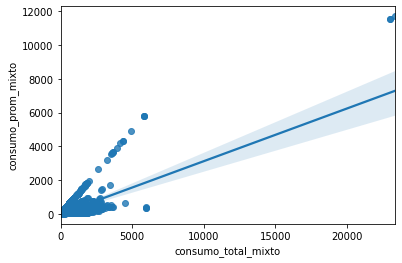

In [109]:
sns.regplot(x='consumo_total_mixto',y='consumo_prom_mixto',data=agua)

<AxesSubplot:xlabel='consumo_total_dom', ylabel='consumo_prom_dom'>

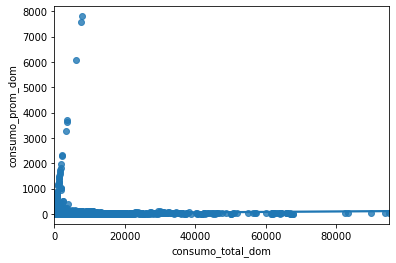

In [110]:
sns.regplot(x='consumo_total_dom',y='consumo_prom_dom',data=agua)

<AxesSubplot:xlabel='consumo_total_no_dom', ylabel='consumo_prom_no_dom'>

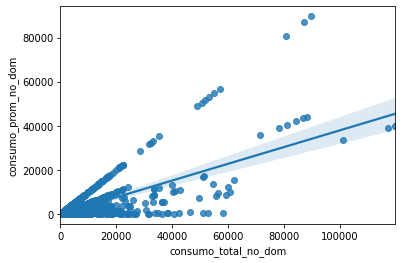

In [111]:
sns.regplot(x='consumo_total_no_dom',y='consumo_prom_no_dom',data=agua)

<AxesSubplot:xlabel='consumo_total', ylabel='consumo_prom'>

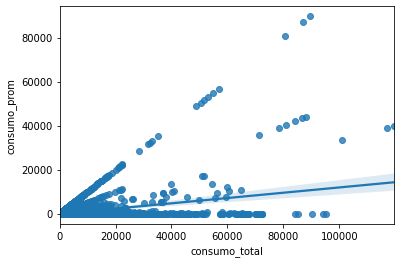

In [112]:
sns.regplot(x='consumo_total',y='consumo_prom',data=agua)

### Consumo Total Mixto

Como se comento durante el EDA, el `consumo_total_mixto`tiene al menos 25% de los datos en 0.
Adicionalmente, la variable presenta una dispersion importante con presencia de posibles datos atipicos.

<AxesSubplot:xlabel='consumo_total_mixto'>

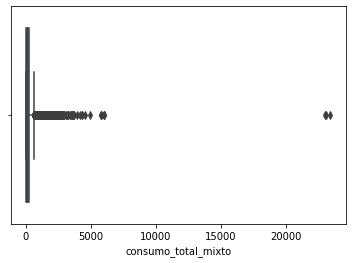

In [119]:
sns.boxplot(x=agua['consumo_total_mixto'])
#sns.boxplot(x=agua[(agua.consumo_total_mixto>0)]['consumo_total_mixto']) Analisis sin 0's

Si consideramos la estacionalidad durante el analisis, podemos cotejar que a pesar de que las figuras son similares entre distintos bimestres. No necesariamente son consistentes entre ellos.

<AxesSubplot:xlabel='consumo_total_mixto', ylabel='bimestre'>

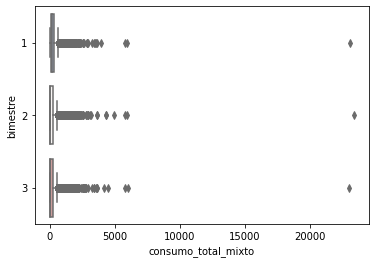

In [113]:
sns.boxplot(x='consumo_total_mixto',y='bimestre',data=agua,palette='vlag')

Principalmente, la alcaldia de Miguel Hidalgo muestra valores fuera de rango respecto a las demas alcaldias.
Importante corroborar que se registre correcamente la data de Azcapotzalco, Cuajimalpa, Cuauhtemoc, G.A.Madero y M.Hidalgo para no generar incosistencias en las inferencias.

<AxesSubplot:xlabel='consumo_total_mixto', ylabel='alcaldia'>

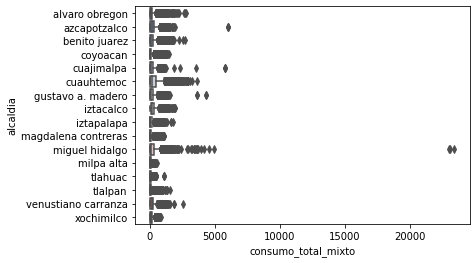

In [102]:
sns.boxplot(x='consumo_total_mixto',y='alcaldia',data=agua,palette='vlag')

### Consumo Total

¿Cual es la diferencia entre Consumo Total y Consumo mixto? En la documentacion no se menciona la definicion de la categoria total y podria interpretarse de la misma manera que mixto cuando revisando la informacion no son identicas.

<AxesSubplot:xlabel='consumo_total_mixto', ylabel='consumo_total'>

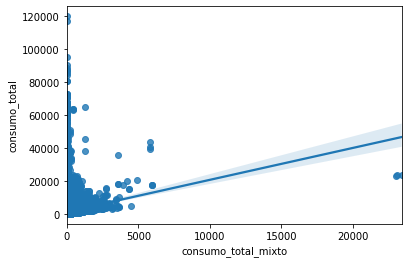

In [124]:
sns.regplot(x='consumo_total_mixto',y='consumo_total',data=agua)

El cuartil 75% de la variable `consumo_total`está en un valor de 1,808, mientras que el máximo está en 119,727. Lo que nos podría ayudar a concluir que la dispersión de la distribución es alta.

<AxesSubplot:xlabel='consumo_total'>

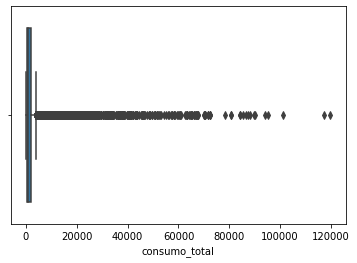

In [120]:
sns.boxplot(x=agua['consumo_total'])

Durante el primer bimestre el valor atipico de mayor valor de la serie no se presenta. Ademas de contar con el segundo valor atipico mas grande que no se repite con el mismo valor los siguientes periodos.

<AxesSubplot:xlabel='consumo_total', ylabel='bimestre'>

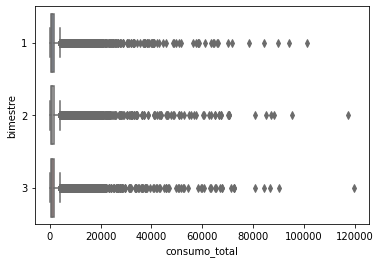

In [121]:
sns.boxplot(x='consumo_total',y='bimestre',data=agua,palette='vlag')

Para esta variable practicamente todas las alcaldias muestran valores atipicos; siendo Gustavo A. Madero el que presenta los valores mas grandes.

<AxesSubplot:xlabel='consumo_total', ylabel='alcaldia'>

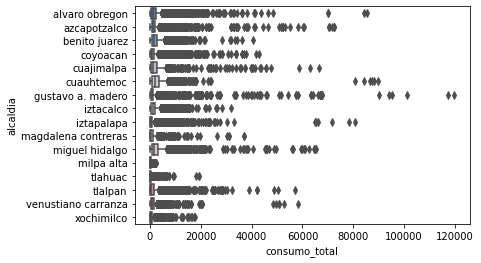

In [129]:
sns.boxplot(x='consumo_total',y='alcaldia',data=agua,palette='vlag')

### Consumo Total Domestico

Esta variable presenta un importante presencia de valores atipicos. Es decir, a partir del 75% de los datos la distancia es muy grande entre los datos faltantes.

<AxesSubplot:xlabel='consumo_total_dom'>

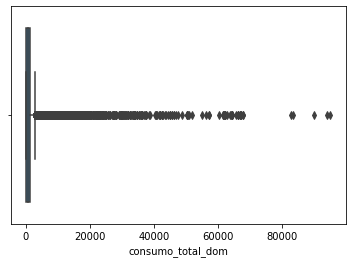

In [125]:
sns.boxplot(x=agua['consumo_total_dom'])

Durante el primer bimestre el segundo valor atipico de mayor valor de la serie no se presenta.

<AxesSubplot:xlabel='consumo_total_dom', ylabel='bimestre'>

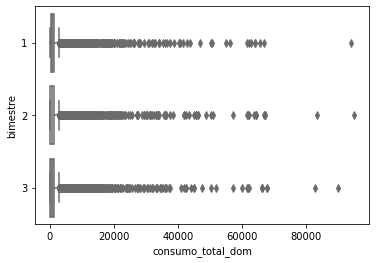

In [127]:
sns.boxplot(x='consumo_total_dom',y='bimestre',data=agua,palette='vlag')

El compartimiento de esta variable respecto a las alcaldias es mas parecida a la de consumo_total que al consumo_total_mixto.

<AxesSubplot:xlabel='consumo_total_dom', ylabel='alcaldia'>

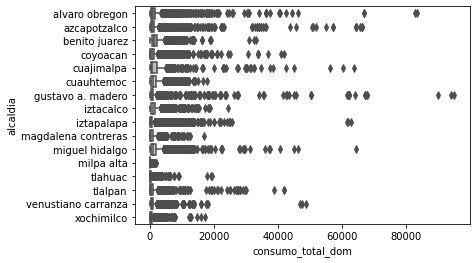

In [128]:
sns.boxplot(x='consumo_total_dom',y='alcaldia',data=agua,palette='vlag')

### Consumo Total No Domestico

Esta variable tambien muestra una presencia considerable de valores atipicos.

<AxesSubplot:xlabel='consumo_total_no_dom'>

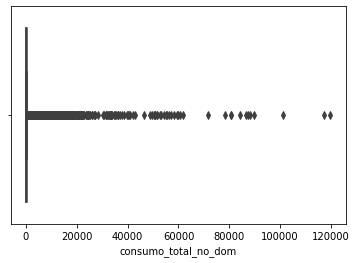

In [131]:
sns.boxplot(x=agua['consumo_total_no_dom'])

Durante el primer bimestre el segundo valor atipico de mayor valor de la serie no se presenta.

<AxesSubplot:xlabel='consumo_total_no_dom', ylabel='bimestre'>

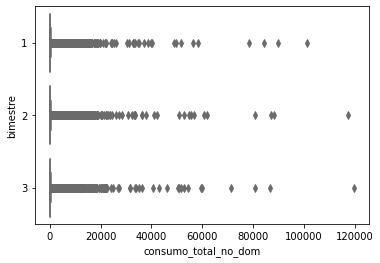

In [132]:
sns.boxplot(x='consumo_total_no_dom',y='bimestre',data=agua,palette='vlag')

La alcaldia de Cuauhtemoc, G. A. Madero e Izatapalapa presentan la dispersion mas grande.

<AxesSubplot:xlabel='consumo_total_no_dom', ylabel='alcaldia'>

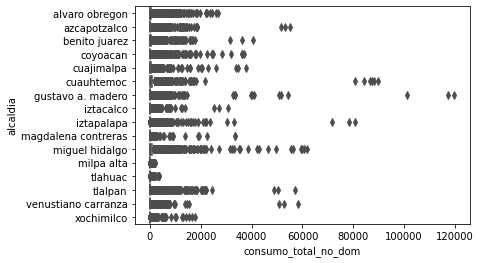

In [133]:
sns.boxplot(x='consumo_total_no_dom',y='alcaldia',data=agua,palette='vlag')

In [54]:
agua.head()

,consumo_total_mixto,anio,nomgeo,consumo_prom_dom,consumo_total_dom,alcaldia,colonia,consumo_prom_mixto,consumo_total,consumo_prom,consumo_prom_no_dom,bimestre,consumo_total_no_dom,gid,indice_des,latitud,longitud
0,159.72,2019,gustavo a. madero,42.566364,468.23,gustavo a. madero,7 de noviembre,53.24,631.00,42.066667,3.05,3,3.05,57250,alto,19.455260,-99.112662
1,0.00,2019,gustavo a. madero,35.936667,107.81,gustavo a. madero,7 de noviembre,0.00,115.13,28.782500,7.32,3,7.32,57253,medio,19.455260,-99.112662
2,0.00,2019,gustavo a. madero,24.586000,122.93,gustavo a. madero,7 de noviembre,0.00,197.96,32.993333,75.03,3,75.03,57255,popular,19.455720,-99.113582
3,0.00,2019,gustavo a. madero,0.000000,0.00,gustavo a. madero,nueva tenochtitlan,0.00,253.53,84.510000,84.51,3,253.53,57267,bajo,19.459647,-99.104469
4,56.72,2019,azcapotzalco,67.436250,539.49,azcapotzalco,prohogar,56.72,839.35,76.304545,121.57,3,243.14,57330,bajo,19.474161,-99.146750


## Relacion variables con indice_des

`consumo_total` y `consumo_total_dom`presentan una relacion similar por tipo de indice_des; es decir, los valores estan mas distribuidos que los referentes a `consumo_total_mixto` y `consumo_total_no_dom`.

(0.0, 2000.0)

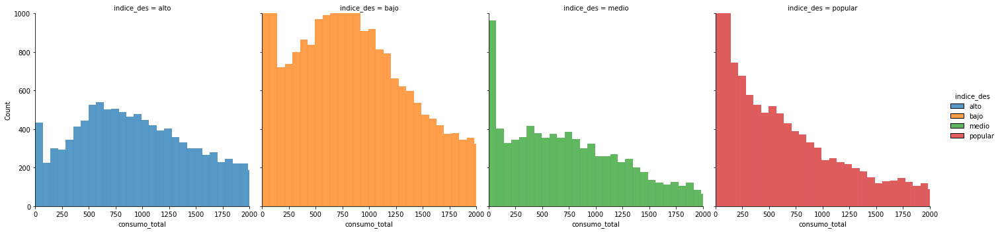

In [140]:
sns.displot(data=agua,x='consumo_total',hue='indice_des',col='indice_des')
plt.ylim(0,1000)
plt.xlim(0,2000)

(0.0, 2000.0)

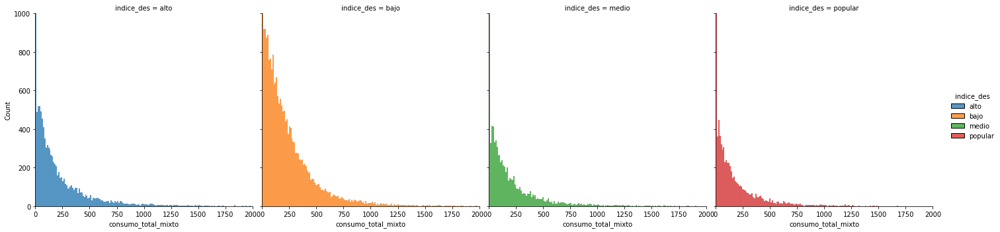

In [141]:
sns.displot(data=agua,x='consumo_total_mixto',hue='indice_des',col='indice_des')
plt.ylim(0,1000)
plt.xlim(0,2000)

(0.0, 2000.0)

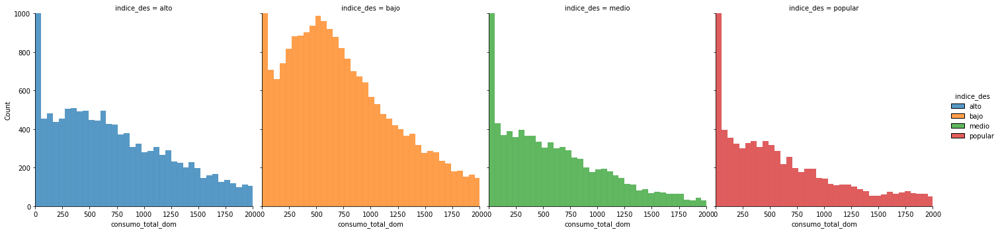

In [143]:
sns.displot(data=agua,x='consumo_total_dom',hue='indice_des',col='indice_des')
plt.ylim(0,1000)
plt.xlim(0,2000)

(0.0, 2000.0)

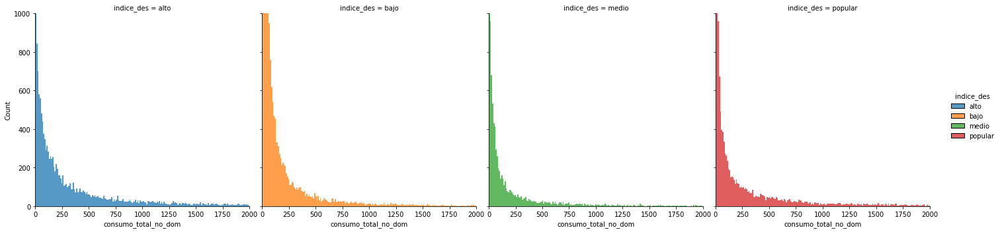

In [142]:
sns.displot(data=agua,x='consumo_total_no_dom',hue='indice_des',col='indice_des')
plt.ylim(0,1000)
plt.xlim(0,2000)

In [155]:
#Relacion de 3 variables usando scatter plot
#sns.scatterplot(data=agua, x="consumo_prom_mixto", y="consumo_prom_dom", hue="indice_des")

In [156]:
#Relacion de 3 variables usando scatter plot
#sns.scatterplot(data=agua, x="consumo_prom_mixto", y="consumo_prom_dom", hue="indice_des")
#plt.xlim(0,2000)
#plt.ylim(0,2000)

In [157]:
#Relacion de variable con categoria y luego prediccion
#Relacion con bimestre
#sns.catplot(x='bimestre',y='consumo_prom_mixto',hue='indice_des',kind='swarm',data=agua.head(1000))
#Relacion con alcaldia
#sns.catplot(x='alcaldia',y='consumo_prom_dom',hue='indice_des',kind='swarm',data=agua.head(1000))

Lo que estamos buscando es una relacion en pares la cual nos permita identificar un patron para pronosticar el tipo de indice.
Para el caso de `consumo_total_dom` y `consumo_total` asi como `consumo_total_no_dom` y `consumo_total` podemos identificar de manera mas rapida conjuntos de indices dependiendo esas variables. El analisis no es concluyente pero puede ayudarnos a valorar esas caracteristicas.

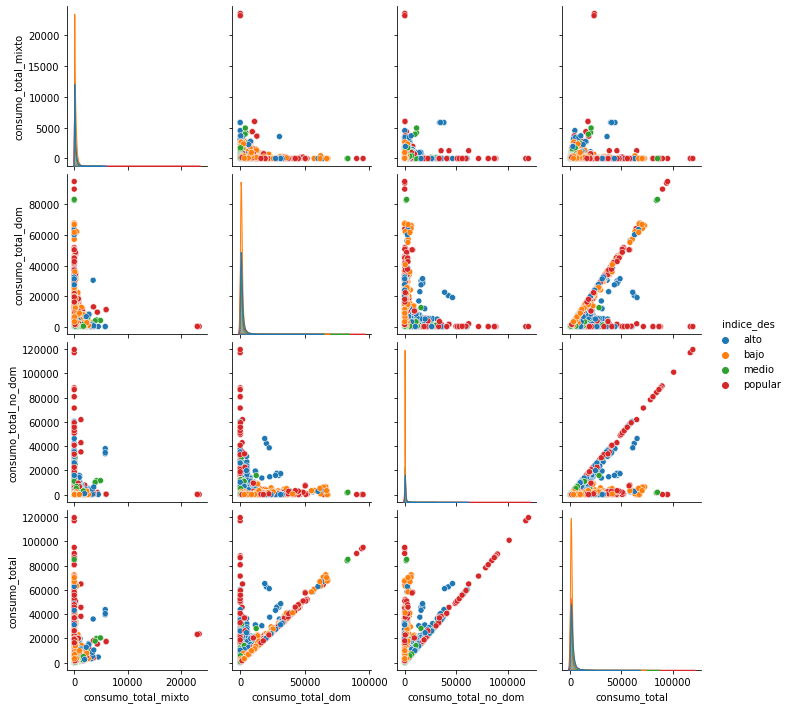

In [154]:
sns.pairplot(data=agua[['consumo_total_mixto','consumo_total_dom','consumo_total_no_dom','consumo_total','indice_des']], hue="indice_des")

Utilizando todas las variables de consumo_total para cada una de las alcaldias, se puede notar que las distribuciones de los datos para cada indice generalmente se intersectan; es decir, no hay una diferenciacion por alcaldia/consumo para los indices.

(0.0, 10000.0)

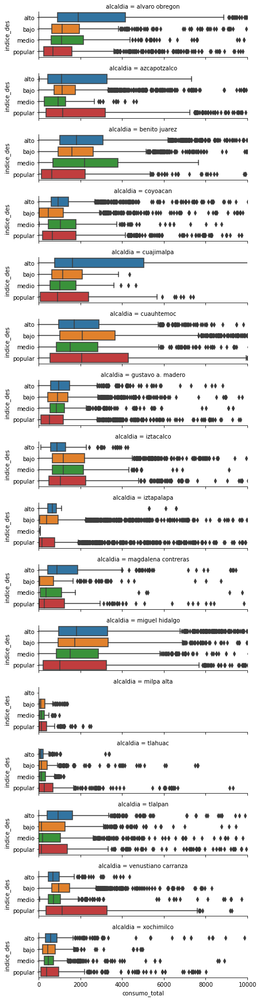

In [160]:
sns.catplot(x="consumo_total", y="indice_des", row="alcaldia",
                kind="box", orient="h", height=1.5, aspect=4,
                data=agua)
plt.xlim(0,10000)

(0.0, 500.0)

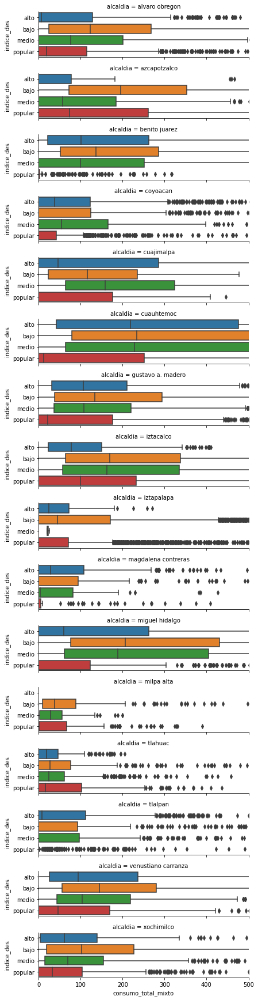

In [163]:
sns.catplot(x="consumo_total_mixto", y="indice_des", row="alcaldia",
                kind="box", orient="h", height=1.5, aspect=4,
                data=agua)
plt.xlim(0,500)

(0.0, 10000.0)

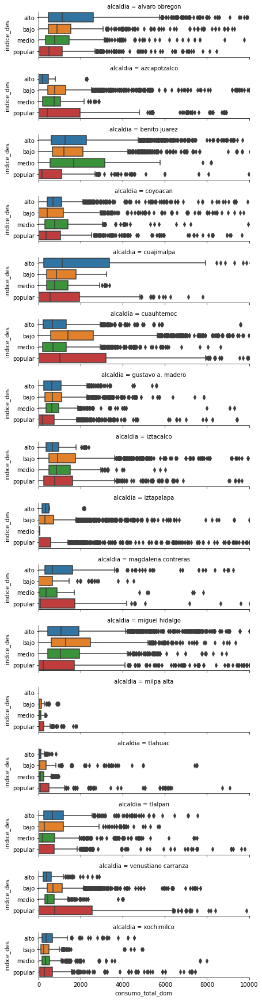

In [164]:
sns.catplot(x="consumo_total_dom", y="indice_des", row="alcaldia",
                kind="box", orient="h", height=1.5, aspect=4,
                data=agua)
plt.xlim(0,10000)

(0.0, 2500.0)

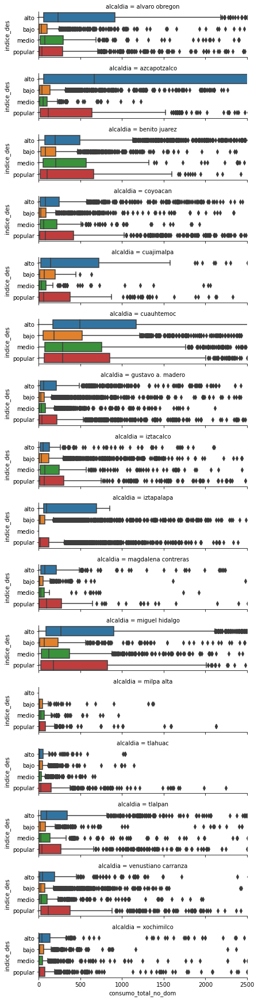

In [166]:
sns.catplot(x="consumo_total_no_dom", y="indice_des", row="alcaldia",
                kind="box", orient="h", height=1.5, aspect=4,
                data=agua)
plt.xlim(0,2500)